In [10]:
import pandas as pd
import numpy as np

pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

from sklearn.preprocessing import MinMaxScaler

In [11]:
# Project Specific Libraries
import os
import librosa
import librosa.display
import glob 
import skimage

In [12]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [13]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [14]:
!kaggle datasets download -d chrisfilo/urbansound8k

100% 5.59G/5.61G [00:33<00:00, 223MB/s]
100% 5.61G/5.61G [00:34<00:00, 177MB/s]


In [15]:
!unzip urbansound8k.zip

Streaming output truncated to the last 5000 lines.
  inflating: fold4/151877-5-1-0.wav  
  inflating: fold4/154758-5-0-0.wav  
  inflating: fold4/154758-5-0-1.wav  
  inflating: fold4/154758-5-0-10.wav  
  inflating: fold4/154758-5-0-11.wav  
  inflating: fold4/154758-5-0-12.wav  
  inflating: fold4/154758-5-0-13.wav  
  inflating: fold4/154758-5-0-14.wav  
  inflating: fold4/154758-5-0-15.wav  
  inflating: fold4/154758-5-0-16.wav  
  inflating: fold4/154758-5-0-17.wav  
  inflating: fold4/154758-5-0-18.wav  
  inflating: fold4/154758-5-0-19.wav  
  inflating: fold4/154758-5-0-2.wav  
  inflating: fold4/154758-5-0-20.wav  
  inflating: fold4/154758-5-0-21.wav  
  inflating: fold4/154758-5-0-3.wav  
  inflating: fold4/154758-5-0-4.wav  
  inflating: fold4/154758-5-0-5.wav  
  inflating: fold4/154758-5-0-6.wav  
  inflating: fold4/154758-5-0-7.wav  
  inflating: fold4/154758-5-0-8.wav  
  inflating: fold4/154758-5-0-9.wav  
  inflating: fold4/155320-3-0-0.wav  
  inflating: fold4/156362

In [16]:
file = 'UrbanSound8K.csv'

In [17]:
import pandas as pd

In [18]:
df = pd.read_csv(file)
df

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
...,...,...,...,...,...,...,...,...
8727,99812-1-2-0.wav,99812,159.522205,163.522205,2,7,1,car_horn
8728,99812-1-3-0.wav,99812,181.142431,183.284976,2,7,1,car_horn
8729,99812-1-4-0.wav,99812,242.691902,246.197885,2,7,1,car_horn
8730,99812-1-5-0.wav,99812,253.209850,255.741948,2,7,1,car_horn


In [19]:
import matplotlib.pyplot as plt
%matplotlib inline

In [20]:
import IPython.display as ipd
import librosa
import librosa.display

In [21]:
filename = '/content/fold1/101415-3-0-2.wav'

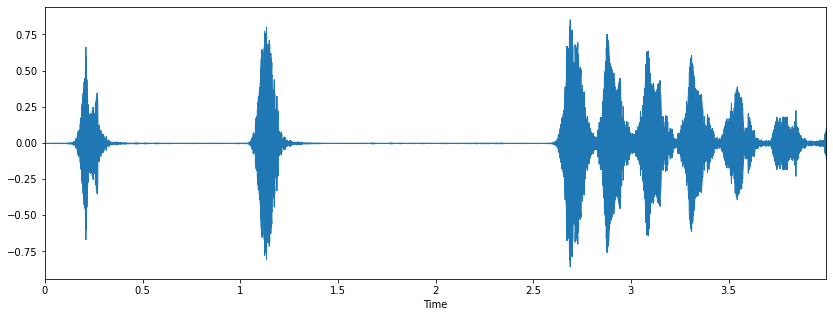

In [22]:
### Dog Sound
plt.figure(figsize=(14,5))
data,sample_rate=librosa.load(filename)
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [23]:
sample_rate

22050

##We prefer using librosa than scipy as librosa normalizes all the stereo sounds to mono so that the sample_rate of the training data(sound) remains constant(22050 KHz) which helps in proper model building.

In [24]:
from scipy.io import wavfile as wav
wave_sample_rate, wave_audio = wav.read(filename)

In [25]:
wave_sample_rate

48000

In [26]:
wave_audio #Using scipy, not normalized

array([   -5,    -5,    -6, ..., -1576, -1566, -1557], dtype=int16)

In [27]:
data #Using Librosa, normalized data points

array([-0.00011662, -0.00017163, -0.00017833, ..., -0.04541198,
       -0.04675572, -0.05040179], dtype=float32)

In [28]:
#Checking whether dataset is imbalanced
df['class'].value_counts()

dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

## Conclusion: Data is not imbalanced since there are sufficient unique values of the column classes.

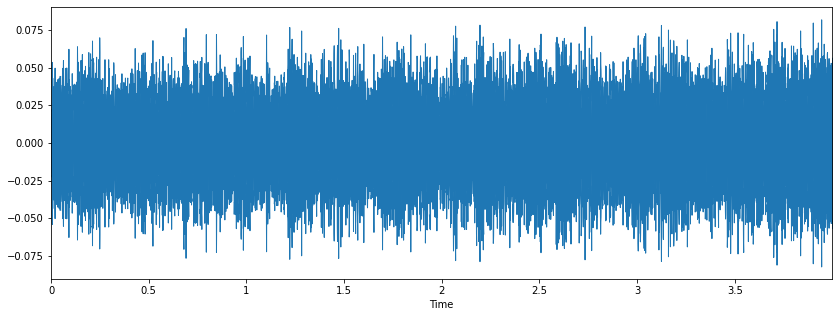

In [29]:
#Taking another random sample and plotting it
filename1 = '/content/fold3/13230-0-0-11.wav'
plt.figure(figsize=(14,5))
data,sample_rate=librosa.load(filename1)
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename1)

### **Data Pre-Processing**

In [30]:
import librosa
audio_file_path='/content/fold1/193698-2-0-64.wav'
librosa_audio_data,librosa_sample_rate=librosa.load(audio_file_path)

In [31]:
print(librosa_audio_data)

[ 0.00342849  0.00319949 -0.00487106 ... -0.00486243 -0.00099006
  0.00356372]


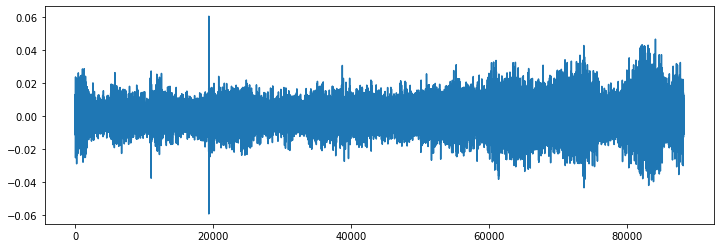

In [32]:
# Plotting the librosa audio data
import matplotlib.pyplot as plt
# Original audio with 1 channel (mono)
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio_data)

###Observation
Here Librosa converts the signal to mono, meaning the channel will always be 1

In [33]:
### Reading with scipy
from scipy.io import wavfile as wav
wave_sample_rate, wave_audio = wav.read(audio_file_path) 

In [34]:
wave_audio

array([[  3102208,  20136960],
       [  -257536,  18680320],
       [ -3243776,  15260160],
       ...,
       [ 21472512, -13864192],
       [ 20958720,  -6502400],
       [ 21232128,    193280]], dtype=int32)

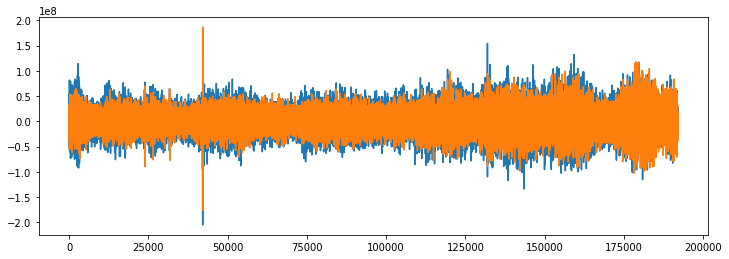

In [35]:
import matplotlib.pyplot as plt

# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(wave_audio)

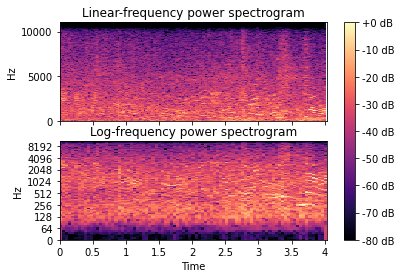

In [36]:
#Spectrogram of children-playing
import matplotlib.pyplot as plt
#y, sr = librosa.load(librosa.ex('choice'), duration = 15)
y, sr = librosa.load(audio_file_path, duration = 15)
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',
                               sr=sr, ax=ax[0])
ax[0].set(title='Linear-frequency power spectrogram')
ax[0].label_outer()
## Log-frequency power spectrogram
hop_length = 1024
D = librosa.amplitude_to_db(np.abs(librosa.stft(y, hop_length=hop_length)),
                            ref=np.max)
librosa.display.specshow(D, y_axis='log', sr=sr, hop_length=hop_length,
                         x_axis='time', ax=ax[1])
ax[1].set(title='Log-frequency power spectrogram')
ax[1].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")

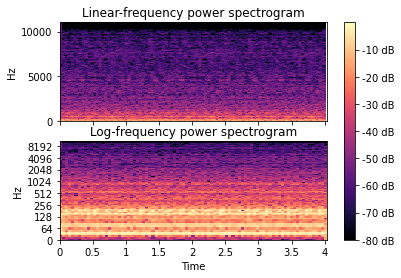

In [37]:
#Spectrogram of engine-idling
filename2 = '/content/fold8/113202-5-0-13.wav'

#y, sr = librosa.load(librosa.ex('choice'), duration = 15)
y, sr = librosa.load(filename2, duration = 15)
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',
                               sr=sr, ax=ax[0])
ax[0].set(title='Linear-frequency power spectrogram')
ax[0].label_outer()
## Log-frequency power spectrogram
hop_length = 1024
D = librosa.amplitude_to_db(np.abs(librosa.stft(y, hop_length=hop_length)),
                            ref=np.max)
librosa.display.specshow(D, y_axis='log', sr=sr, hop_length=hop_length,
                         x_axis='time', ax=ax[1])
ax[1].set(title='Log-frequency power spectrogram')
ax[1].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")

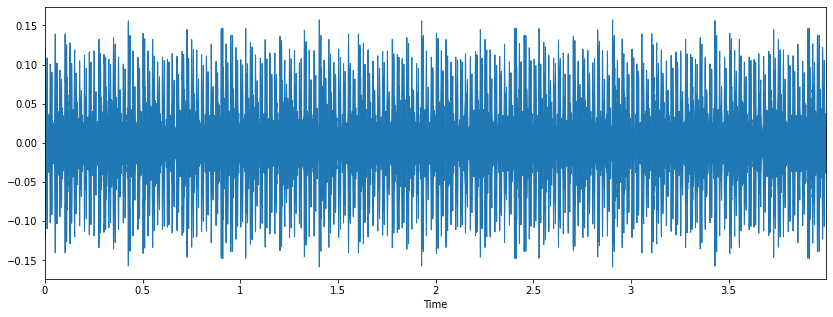

In [38]:
plt.figure(figsize=(14,5))
data,sample_rate=librosa.load(filename2)
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename2)

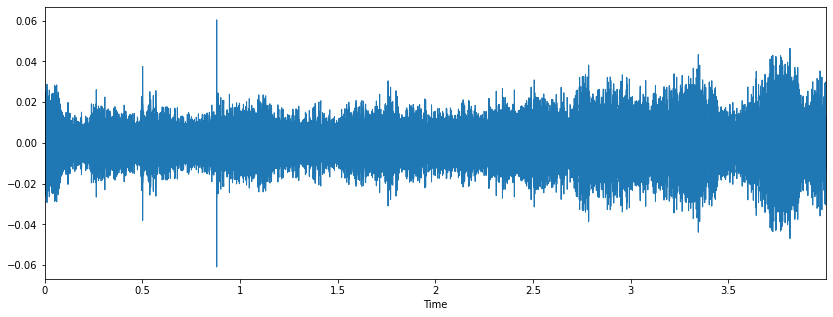

In [39]:
plt.figure(figsize=(14,5))
data,sample_rate=librosa.load(audio_file_path)
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(audio_file_path)

###Extract Features

Here we will be using Mel-Frequency Cepstral Coefficients(MFCC) from the audio samples. The MFCC summarises the frequency distribution across the window size, so it is possible to analyse both the frequency and time characteristics of the sound. These audio representations will allow us to identify features for classification.



In [40]:
mfccs = librosa.feature.mfcc(y=librosa_audio_data, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 173)


In [41]:
mfccs

array([[-302.78748   , -298.2474    , -307.72604   , ..., -320.3779    ,
        -314.69278   , -316.36676   ],
       [  51.43048   ,   61.90161   ,   58.62576   , ...,  113.10539   ,
         111.6397    ,  103.84328   ],
       [ -57.21422   ,  -63.63636   ,  -70.166565  , ...,  -51.399017  ,
         -54.68876   ,  -55.07167   ],
       ...,
       [   3.0374494 ,    1.2219687 ,   -2.2629356 , ...,    3.618823  ,
           1.8261709 ,   -5.4917746 ],
       [  -4.3765106 ,   -4.644486  ,   -7.5276194 , ...,   -0.88075805,
          -0.38942325,   -1.6389496 ],
       [   2.624237  ,    1.1744273 ,   -0.9020312 , ...,   -4.456979  ,
          -2.0864546 ,   -1.9865289 ]], dtype=float32)

In [42]:
#### Extracting MFCC's For every audio file
audio_dataset_path = '/content'
df

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
...,...,...,...,...,...,...,...,...
8727,99812-1-2-0.wav,99812,159.522205,163.522205,2,7,1,car_horn
8728,99812-1-3-0.wav,99812,181.142431,183.284976,2,7,1,car_horn
8729,99812-1-4-0.wav,99812,242.691902,246.197885,2,7,1,car_horn
8730,99812-1-5-0.wav,99812,253.209850,255.741948,2,7,1,car_horn


In [43]:
def features_extractor(file_name):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
    
    return mfccs_scaled_features

In [44]:
import numpy as np
from tqdm import tqdm
# Now we iterate through every audio file and extract features 
# using Mel-Frequency Cepstral Coefficients
extracted_features=[]
for index_num,row in tqdm(df.iterrows()):
    file_name = os.path.join(os.path.abspath(audio_dataset_path),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    final_class_labels=row["class"]
    data=features_extractor(file_name)
    extracted_features.append([data,final_class_labels])

3555it [05:28, 10.86it/s]/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1323
  n_fft, y.shape[-1]
8325it [12:36, 16.44it/s]/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1103
  n_fft, y.shape[-1]
/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1523
  n_fft, y.shape[-1]
8732it [13:10, 11.04it/s]


In [45]:
# Converting extracted_features to a separate dataframe
extracted_features_df=pd.DataFrame(extracted_features,columns=['feature','class'])
extracted_features_df

,feature,class
0,"[-214.95764, 70.502464, -130.70279, -53.116936...",dog_bark
1,"[-423.7311, 109.2299, -52.872597, 60.827538, 0...",children_playing
2,"[-458.52844, 121.35432, -46.535675, 51.969467,...",children_playing
3,"[-413.63254, 101.61351, -35.43868, 53.047146, ...",children_playing
4,"[-446.38693, 113.68634, -52.4572, 60.349724, 2...",children_playing
...,...,...
8727,"[-398.28668, 135.51045, -50.712845, 35.865715,...",car_horn
8728,"[-345.8734, 86.30015, -45.13337, 51.709526, -3...",car_horn
8729,"[-303.65482, 111.28415, -45.883854, 35.81933, ...",car_horn
8730,"[-343.75665, 125.42341, -54.89965, 34.886555, ...",car_horn


In [46]:
x = np.array(extracted_features_df['feature'].tolist())
y = np.array(extracted_features_df['class'].tolist())

In [47]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

le = LabelEncoder()
y = to_categorical(le.fit_transform(y))

In [48]:
x.shape

(8732, 40)

In [50]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 3)
# x_train, x_valid, y_train, y_valid = train_test_split(x_train_val, y_train_val, test_size = 0.2, stratify = y_train_val)
# print("\nNumber of samples in training set :", x_train.shape[0])
# print("\nNumber of samples in validation set :", x_valid.shape[0])
# print("\nNumber of samples in training set :", x_test.shape[0])


Building KNN Model

In [51]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

In [52]:
scaler = StandardScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)

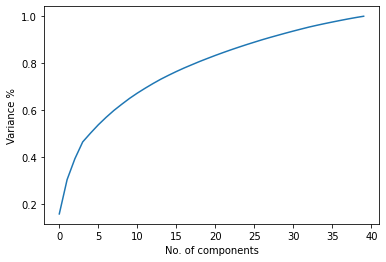

In [53]:
from sklearn.decomposition import PCA    
#Normalization of data
pca = PCA().fit(x_train_scaled)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('No. of components')
plt.ylabel('Variance %')
plt.show()

In [54]:
def KNN():
  grid_params = {
      'n_neighbors': [3, 5, 7, 9, 11, 15],
      'weights': ['uniform', 'distance'],
      'metric': ['euclidean', 'manhattan']
}

  knnmodel = GridSearchCV(KNeighborsClassifier(), grid_params, cv=5, n_jobs=-1)
  return knnmodel

In [55]:
knn_model = KNN()
knn_model.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 5, 7, 9, 11, 15],
                         'weights': ['uniform', 'distance']})

In [56]:
print("Model score: ", knn_model.score(x_test, y_test))

Model score:  0.8941041785918717


In [59]:
import IPython.display as ipd
def predict(path, model):
    audio = np.array([features_extractor(path)])
    classid = np.argmax(model.predict(audio)[0])
    classes = df.groupby('classID')['class'].unique()
    classes
    print('Class predicted :',classes[classid][0],'\n\n')
    return ipd.Audio(path)

In [60]:
#Predicting few samples in DNN
predict('fold4/107653-9-0-14.wav', knn_model)

Class predicted : street_music 




In [61]:
predict('fold10/101382-2-0-42.wav', knn_model)

Class predicted : children_playing 




In [62]:
predict('fold1/103074-7-1-4.wav', knn_model)

Class predicted : jackhammer 




In [63]:
predict('fold10/189985-0-0-0.wav', knn_model)

Class predicted : air_conditioner 




In [64]:
from sklearn.metrics import confusion_matrix, classification_report
ytrue = np.argmax(y_test, axis=1)
ypred = np.argmax(knn_model.predict(x_test), axis=1)
print('\nConfusion Matrix :\n\n')
print(confusion_matrix(ytrue, ypred))
print('\n\nClassification Report : \n\n',classification_report(ytrue, ypred))


Confusion Matrix :


[[214   0   2   0   1   0   0   0   0   1]
 [  8  68   6   1   0   1   0   4   1   1]
 [  8   0 184   2   0   0   0   0   2   3]
 [ 18   0  13 144   0   3   9   1   5   6]
 [  3   0   4   1 185   0   0   4   0   3]
 [  2   0   0   1   0 199   0   0   0   1]
 [  5   0   4   2   1   0  53   0   0   0]
 [  3   0   0   0   2   0   0 179   0   1]
 [  4   0   2   3   0   2   1   0 185   0]
 [ 12   0  17   1   2   2   0   3   2 152]]


Classification Report : 

               precision    recall  f1-score   support

           0       0.77      0.98      0.86       218
           1       1.00      0.76      0.86        90
           2       0.79      0.92      0.85       199
           3       0.93      0.72      0.81       199
           4       0.97      0.93      0.95       200
           5       0.96      0.98      0.97       203
           6       0.84      0.82      0.83        65
           7       0.94      0.97      0.95       185
           8       0.95      0.

DNN model building

In [65]:
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Activation , Dropout
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 42)

In [66]:
num_labels = y.shape[1]
model_dnn = Sequential()

model_dnn.add(Dense(128, input_shape=(40,)))
model_dnn.add(Activation('relu'))
model_dnn.add(Dropout(0.5))

model_dnn.add(Dense(256))
model_dnn.add(Activation('relu'))
model_dnn.add(Dropout(0.5))
model_dnn.add(Dense(256))
model_dnn.add(Activation('relu'))
model_dnn.add(Dropout(0.5))
model_dnn.add(Dense(128))

model_dnn.add(Dense(num_labels))
model_dnn.add(Activation('softmax'))
model_dnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               5248      
                                                                 
 activation (Activation)     (None, 128)               0         
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 activation_1 (Activation)   (None, 256)               0         
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               6

In [67]:
model_dnn.compile(optimizer=tf.keras.optimizers.Adam(),loss=tf.keras.losses.CategoricalCrossentropy(),metrics=['accuracy'])

In [68]:
num_epochs = 150
num_batch_size = 32

history_model = model_dnn.fit(
          x_train, 
          y_train, 
          batch_size=num_batch_size, 
          epochs=num_epochs,
          validation_data=(x_test, y_test)
         )

Epoch 1/150
219/219 [==============================] - 4s 7ms/step - loss: 8.8406 - accuracy: 0.1515 - val_loss: 2.1619 - val_accuracy: 0.2072
Epoch 2/150
219/219 [==============================] - 1s 5ms/step - loss: 2.3421 - accuracy: 0.2093 - val_loss: 2.1090 - val_accuracy: 0.1723
Epoch 3/150
219/219 [==============================] - 1s 4ms/step - loss: 2.0712 - accuracy: 0.2565 - val_loss: 1.9695 - val_accuracy: 0.2164
Epoch 4/150
219/219 [==============================] - 1s 4ms/step - loss: 1.9755 - accuracy: 0.2878 - val_loss: 1.9026 - val_accuracy: 0.2851
Epoch 5/150
219/219 [==============================] - 1s 4ms/step - loss: 1.8773 - accuracy: 0.3346 - val_loss: 1.7274 - val_accuracy: 0.3921
Epoch 6/150
219/219 [==============================] - 1s 4ms/step - loss: 1.7599 - accuracy: 0.3800 - val_loss: 1.5682 - val_accuracy: 0.4619
Epoch 7/150
219/219 [==============================] - 1s 4ms/step - loss: 1.6876 - accuracy: 0.4113 - val_loss: 1.5129 - val_accuracy: 0.4740

In [71]:
score = model_dnn.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model_dnn.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

Training Accuracy:  0.8695776462554932
Testing Accuracy:  0.8340011239051819


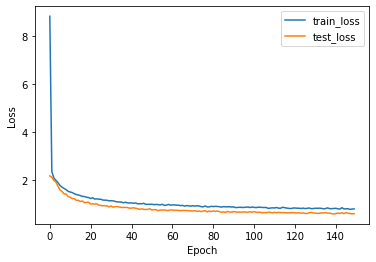

In [72]:
# Plotting Loss of DNN

metrics = history_model.history
plt.plot(history_model.epoch, metrics['loss'], metrics['val_loss'])
plt.legend(['train_loss', 'test_loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

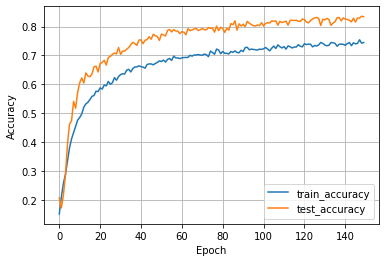

In [73]:
# Plotting Accuracy of DNN Model

plt.plot(history_model.history['accuracy'], label='train_accuracy')
plt.plot(history_model.history['val_accuracy'], label='test_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

In [77]:
import IPython.display as ipd
def predict(path, model):
    audio = np.array([features_extractor(path)])
    classid = np.argmax(model.predict(audio)[0])
    classes = df.groupby('classID')['class'].unique()
    classes
    print('Class predicted :',classes[classid][0],'\n\n')
    return ipd.Audio(path)

In [78]:
#Predicting few samples in DNN
predict('fold4/107653-9-0-14.wav', model_dnn)

1/1 [==============================] - 0s 114ms/step
Class predicted : children_playing 




In [79]:
predict('fold10/101382-2-0-42.wav', model_dnn)

1/1 [==============================] - 0s 21ms/step
Class predicted : children_playing 




In [80]:
predict('fold1/103074-7-1-4.wav', model_dnn)

1/1 [==============================] - 0s 22ms/step
Class predicted : drilling 




In [81]:
predict('fold10/189985-0-0-0.wav', model_dnn)

1/1 [==============================] - 0s 20ms/step
Class predicted : air_conditioner 




In [82]:
#Classification Report
from sklearn.metrics import confusion_matrix, classification_report
ytrue = np.argmax(y_test, axis=1)
ypred = np.argmax(model_dnn.predict(x_test), axis=1)
print('\nConfusion Matrix :\n\n')
print(confusion_matrix(ytrue, ypred))
print('\n\nClassification Report : \n\n',classification_report(ytrue, ypred))

55/55 [==============================] - 0s 2ms/step

Confusion Matrix :


[[193   0   3   2   0   4   0   1   0   0]
 [  1  68   2   1   4   1   0   1   0   8]
 [ 23   0 145   5   0   3   0   2   2   3]
 [  8   0  16 153   7   1   4   0   5   7]
 [  2   0   7   3 167   1   1  13   0  12]
 [  9   0   4   1   0 176   0   0   1   2]
 [  4   0   8   5   0   0  54   0   0   1]
 [  2   0   0   0   6   0   0 197   0   3]
 [  0   0   3   2   0   2   0   0 158   0]
 [ 39   1  25   6   3   3   0   4   3 146]]


Classification Report : 

               precision    recall  f1-score   support

           0       0.69      0.95      0.80       203
           1       0.99      0.79      0.88        86
           2       0.68      0.79      0.73       183
           3       0.86      0.76      0.81       201
           4       0.89      0.81      0.85       206
           5       0.92      0.91      0.92       193
           6       0.92      0.75      0.82        72
           7       0.90      0.9